Add our import statements

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler , MinMaxScaler
from sklearn.model_selection import train_test_split , GridSearchCV
from sklearn.metrics import accuracy_score , classification_report, confusion_matrix , roc_curve , roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from matplotlib import pyplot as plt
from matplotlib import rcParams
from sklearn.tree import plot_tree
from sklearn.decomposition import PCA
from mlxtend.plotting import category_scatter
import seaborn as sns

Pull in our dataset from Github

In [ ]:
url = 'https://raw.githubusercontent.com/jmrieck17/CSC-5800-Final-Project/main/heart.csv'
df = pd.read_csv(url)

print(df.head(5))

   age  sex  cp  trestbps  chol  fbs  restecg  thalach  exang  oldpeak  slope  \
0   52    1   0       125   212    0        1      168      0      1.0      2   
1   53    1   0       140   203    1        0      155      1      3.1      0   
2   70    1   0       145   174    0        1      125      1      2.6      0   
3   61    1   0       148   203    0        1      161      0      0.0      2   
4   62    0   0       138   294    1        1      106      0      1.9      1   

   ca  thal  target  
0   2     3       0  
1   0     3       0  
2   0     3       0  
3   1     3       0  
4   3     2       0  


Show some summary statistics here...

In [ ]:
print('Dataframe Shape:' , df.shape)
print('Column Variables' , list(df.columns))

Dataframe Shape: (1025, 14)
Column Variables ['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach', 'exang', 'oldpeak', 'slope', 'ca', 'thal', 'target']


Here is some more information on the attributes of each column in the dataset:

- **age** (continuous variable)
- **sex** (binary)
    - 1 = male 
    - 0 = female
- **cp** : chest pain type 
    - 1 = typical angina 
    - 2 = atypical angina 
    - 3 = non-anginal pain 
    - 4 = asymptomatic)
- **trestbps** : resting blood pressure (continuous variable)
- **chol** : serum cholestoral in mg/dl (continuous variable)
- **fbs** : fasting blood sugar > 120 mg/dl 
    - 1 = true
    - 0 = false
- **restecg** _ resting electrocardiographic results 
    - 0 = normal
    - 1 = having ST-T wave abnormality
    - 2 = showing probable or definite left ventricular hypertrophy
- **thalach** : maximum heart rate achieved (continuous variable)
- **exang** : exercise induced angina 
    - 1 = yes
    - 0 = no
- **oldpeak** : ST depression induced by exercise relative to rest (continuous variable)
- **slope** : the slope of the peak exercise ST segment 
    - 1 = up-sloping 
    - 2 = flat
    - 3 = down-sloping
- **ca** : number of major vessels 
    - (0-3) colored by flourosopy
- **thal** 
    - 0 = normal
    - 1 = fixed defect
    - 2 = reversable defect
- **target** : diagnosis of heart disease
    - 0 = no
    - 1 = yes

*more information on the data can be found: https://archive.ics.uci.edu/ml/datasets/heart+Disease*


In [ ]:
df.describe()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
count,1025.000000,1025.000000,1025.000000,1025.000000,1025.00000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000
mean,54.434146,0.695610,0.942439,131.611707,246.00000,0.149268,0.529756,149.114146,0.336585,1.071512,1.385366,0.754146,2.323902,0.513171
std,9.072290,0.460373,1.029641,17.516718,51.59251,0.356527,0.527878,23.005724,0.472772,1.175053,0.617755,1.030798,0.620660,0.500070
min,29.000000,0.000000,0.000000,94.000000,126.00000,0.000000,0.000000,71.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,48.000000,0.000000,0.000000,120.000000,211.00000,0.000000,0.000000,132.000000,0.000000,0.000000,1.000000,0.000000,2.000000,0.000000
50%,56.000000,1.000000,1.000000,130.000000,240.00000,0.000000,1.000000,152.000000,0.000000,0.800000,1.000000,0.000000,2.000000,1.000000
75%,61.000000,1.000000,2.000000,140.000000,275.00000,0.000000,1.000000,166.000000,1.000000,1.800000,2.000000,1.000000,3.000000,1.000000
max,77.000000,1.000000,3.000000,200.000000,564.00000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,4.000000,3.000000,1.000000


## Data Visualizations

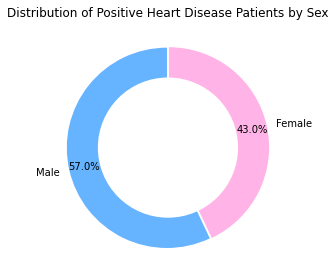

In [ ]:
counts = df[df['target'] == 1]['sex'].value_counts()
labels = ['Male' , 'Female']
colors = ['#66b3ff','#ffb3e6']
explode = (0.01, 0.01)


plt.pie(counts, colors = colors, labels = labels, 
         autopct='%1.1f%%', startangle = 90, 
         pctdistance = 0.85, explode = explode)

centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

plt.title('Distribution of Positive Heart Disease Patients by Sex')
plt.tight_layout()
plt.show()

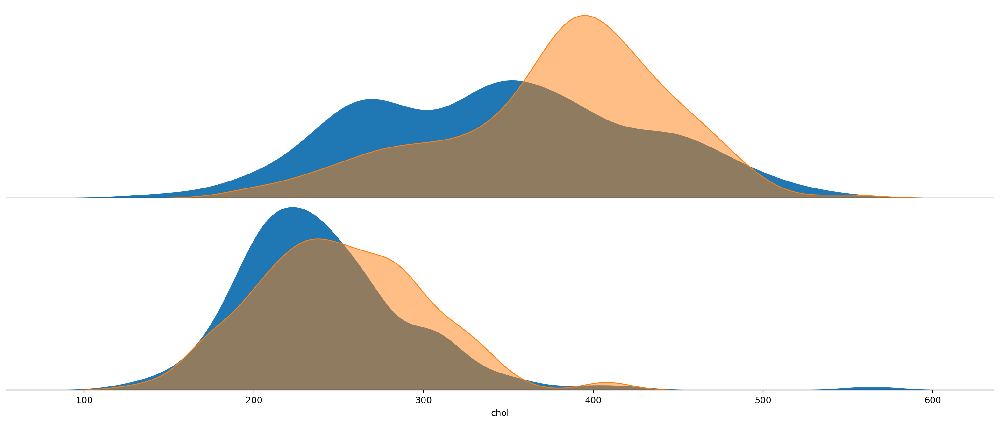

In [ ]:
plt.rcParams['figure.dpi'] = 200
fig=plt.figure(figsize=(20,8),facecolor='white')
ax=[None for i in range(2)]
gs=fig.add_gridspec(2,1)
gs.update(wspace=0, hspace=0)

ax[0]=fig.add_subplot(gs[0,0])
ax[1]=fig.add_subplot(gs[1,0])

sns.kdeplot(data=df[df.target==1],x='age',ax=ax[0],shade=True,alpha=1)
sns.kdeplot(data=df[df.target==0],x='age',ax=ax[0],shade=True,alpha=0.5)
sns.kdeplot(data=df[df.target==1],x='chol',ax=ax[1],shade=True,alpha=1)
sns.kdeplot(data=df[df.target==0],x='chol',ax=ax[1],shade=True,alpha=0.5)

for i in range(2):
    ax[i].set_yticklabels('')
    ax[i].set_ylabel('')
    ax[i].tick_params(axis='y',length=0)
    
    for direction in ['top','right','left']:
        ax[i].spines[direction].set_visible(False)

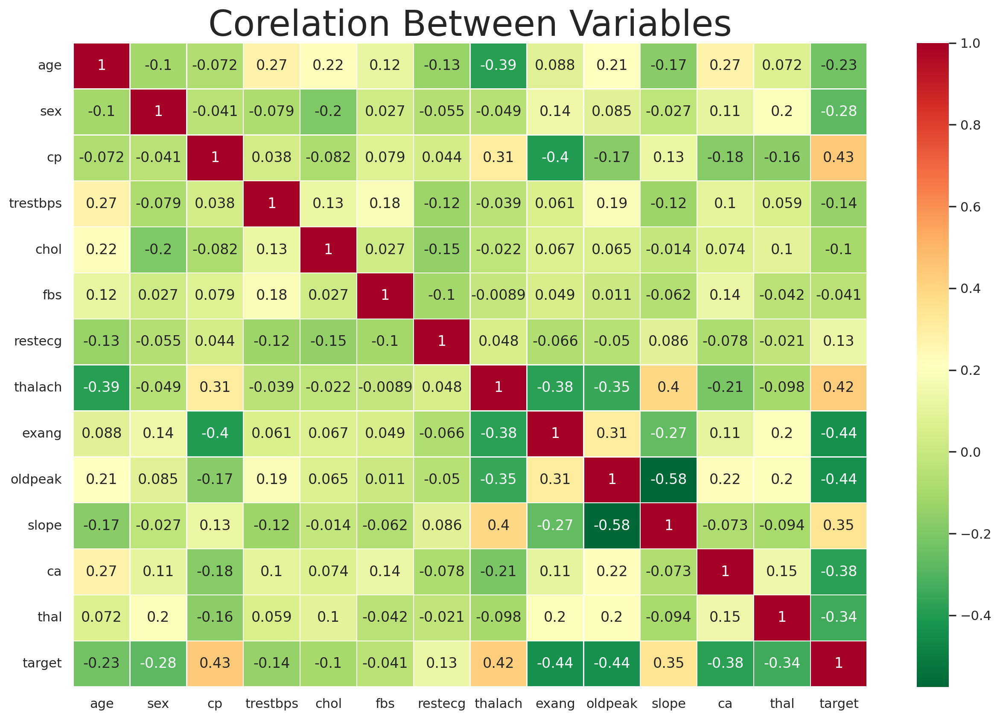

In [ ]:
sns.set(style='dark')
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(),annot=True,linewidths=0.5,cmap='RdYlGn_r')
plt.title('Corelation Between Variables',fontsize=30)
plt.show()

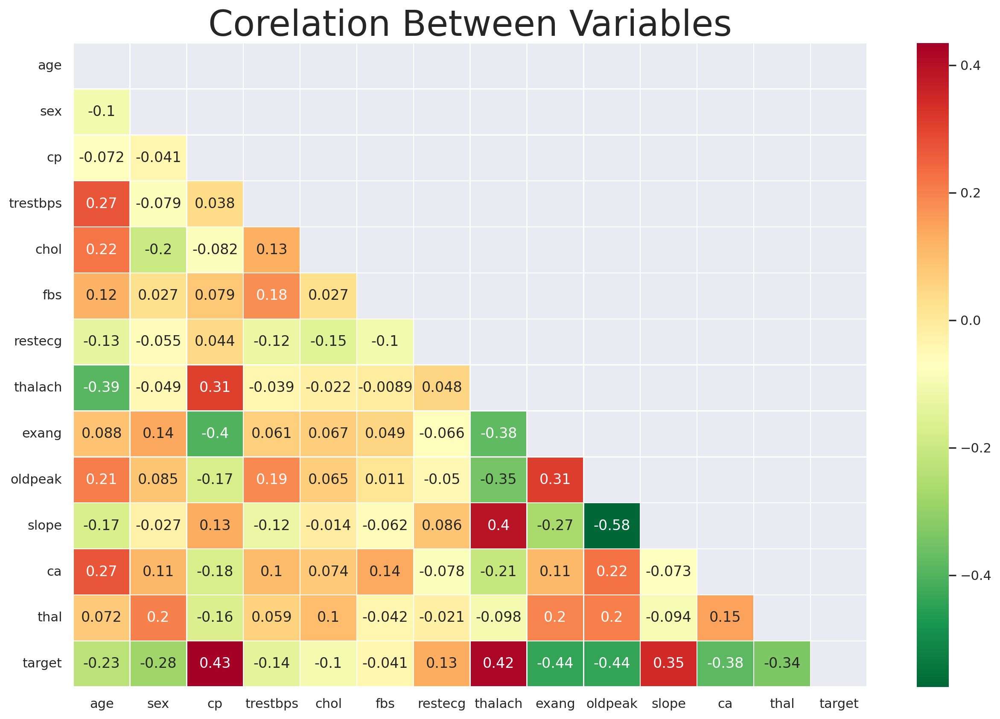

In [ ]:
mask = np.triu(np.ones_like(df.corr()))

sns.set(style='dark')
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(), cmap = 'RdYlGn_r' , annot = True , linewidths=0.5 , mask = mask)
plt.title('Corelation Between Variables',fontsize=30)
plt.show()

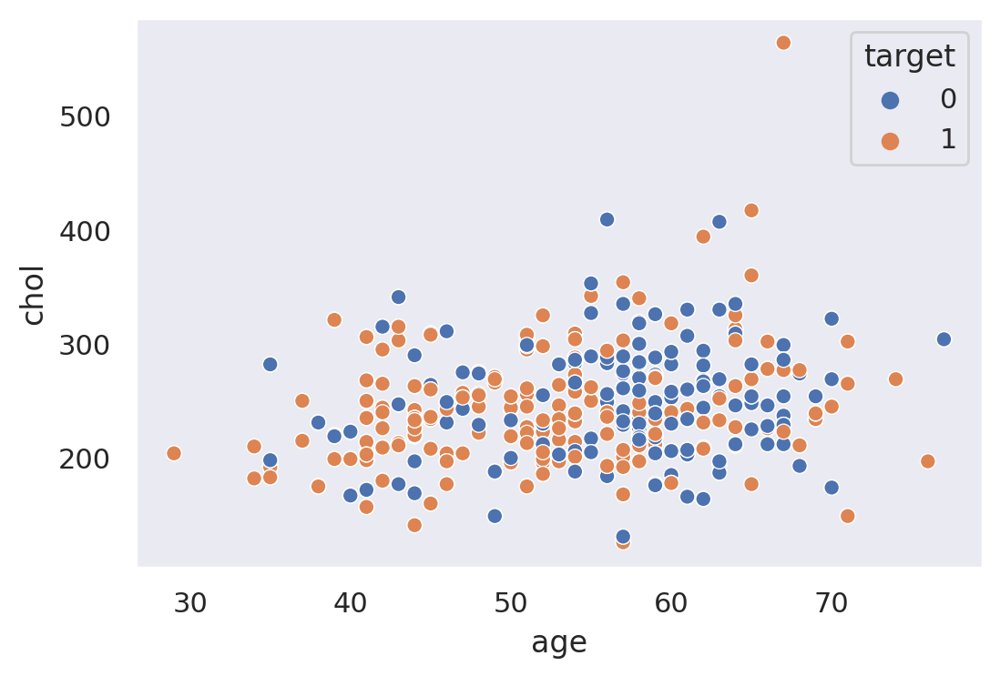

In [ ]:
df = pd.read_csv(url)

# create a scatter plot with the age and cholesterol levels on the x and y axes, respectively
sns.scatterplot(x="age", y="chol", hue="target", data=df)

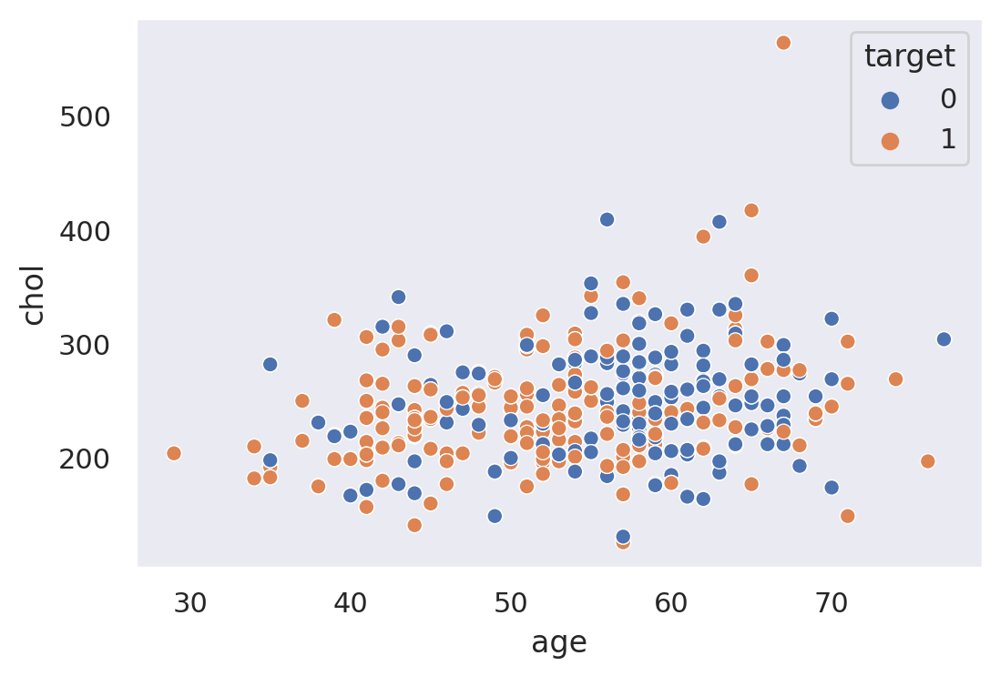

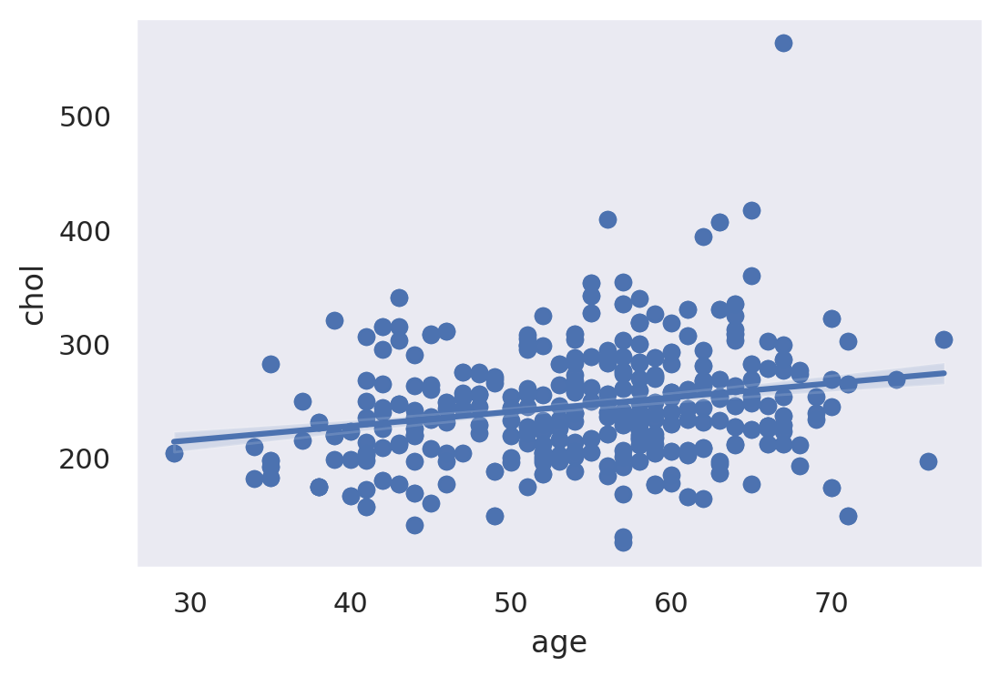

In [ ]:
# create a scatter plot with the age and cholesterol levels on the x and y axes, respectively
sns.scatterplot(x="age", y="chol", hue="target", data=df)
plt.show()

# add the regression line and the Pearson correlation coefficient to the plot
sns.regplot(x="age", y="chol", data=df)
plt.show()




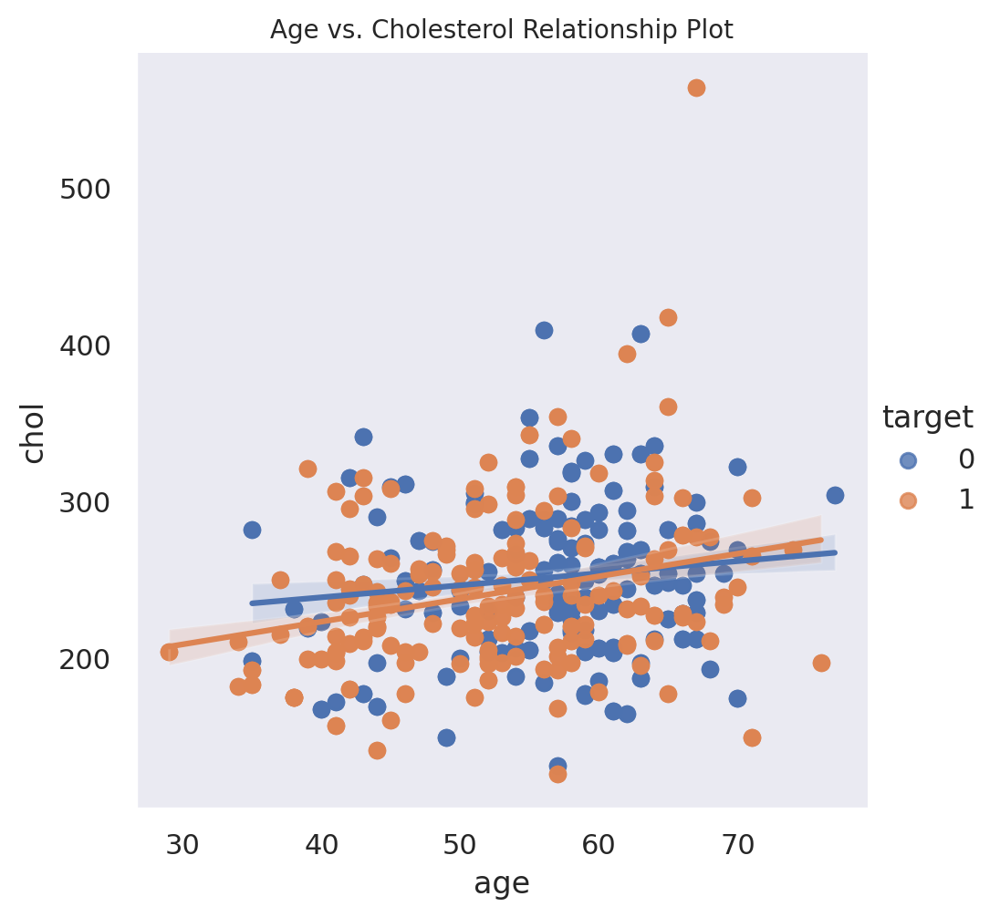

<Figure size 1000x1000 with 0 Axes>

In [ ]:
# this graph modifies the reg-plot graph from above and breaks out the two classifiers better and plots separate regression lines for both of the classifiers

sns.lmplot(x="age", y="chol", hue="target", data=df)
plt.title('Age vs. Cholesterol Relationship Plot',fontsize=10)
plt.figure(figsize=(5,5))
plt.show()

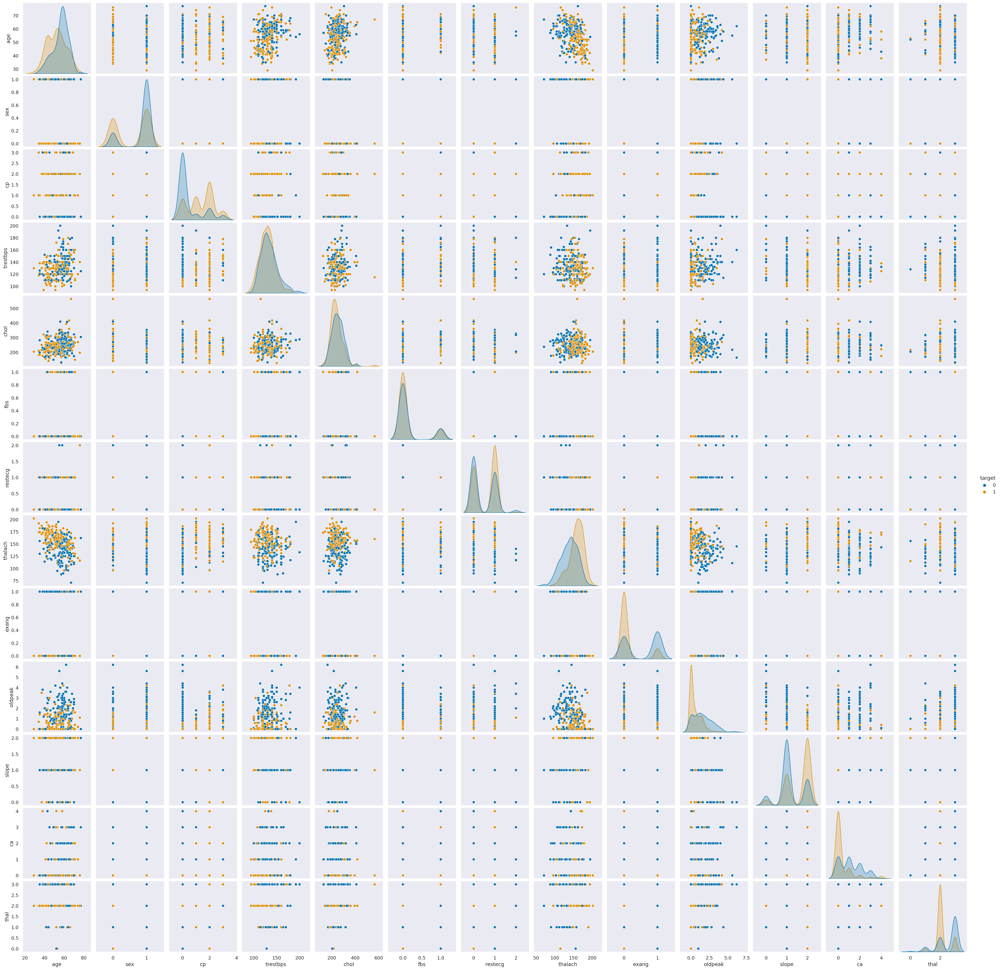

In [ ]:
df = pd.read_csv(url)

sns.pairplot(df, hue="target", palette="colorblind")

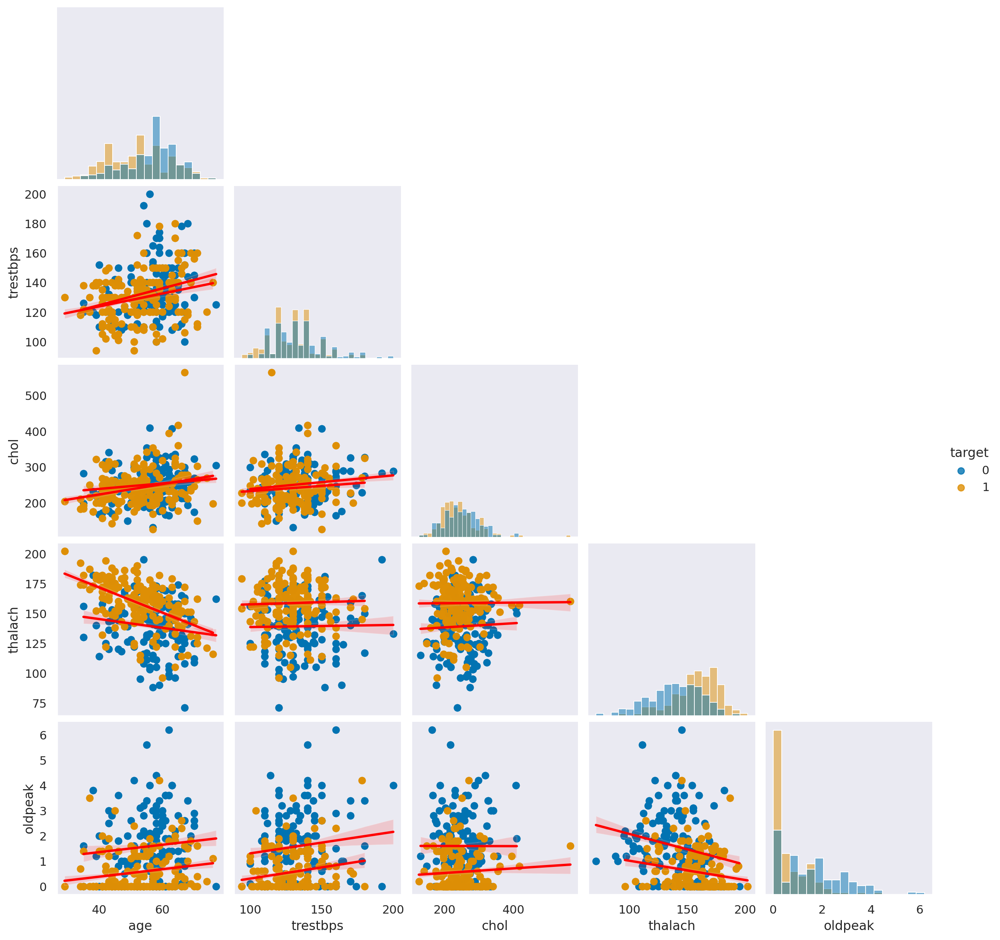

In [ ]:
# Pair plot tht compares all of our continuous variables to each other

df_continuous = df.drop(['sex', 'cp' , 'fbs' , 'restecg' , 'exang' , 'slope' , 'ca' , 'thal'], axis=1)

sns.pairplot(df_continuous, hue="target", palette="colorblind" , corner = True , kind='reg' , plot_kws={'line_kws':{'color':'red'}} , diag_kind="hist")

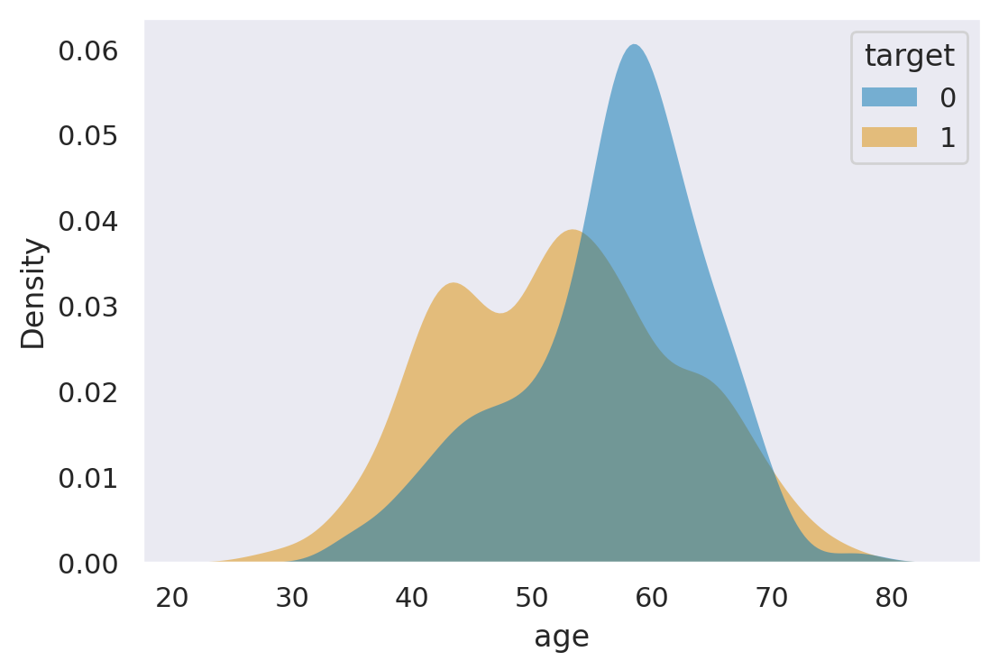

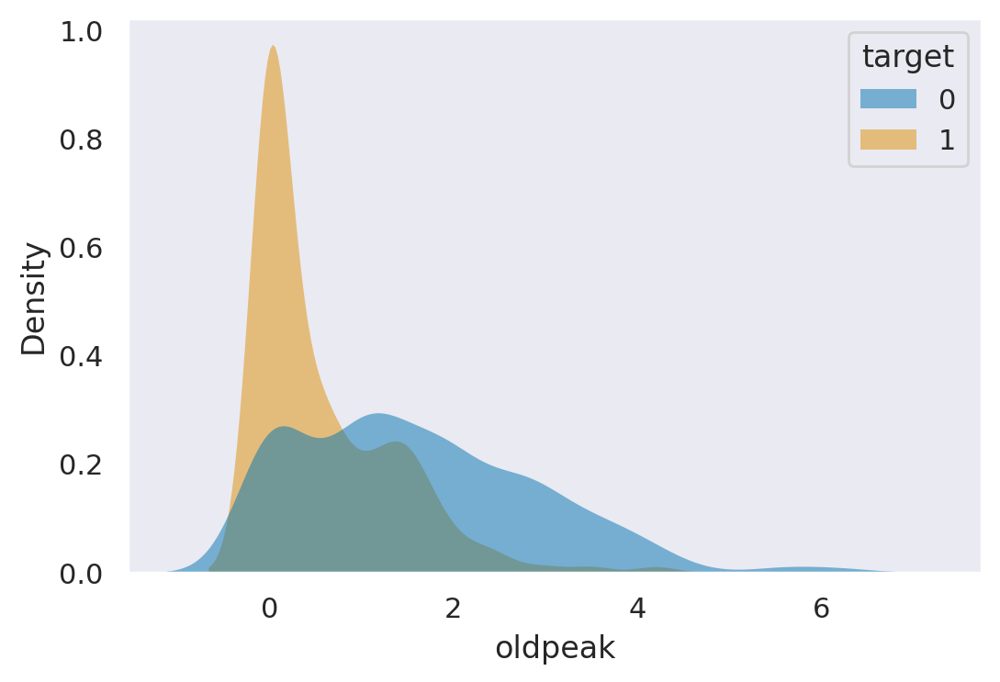

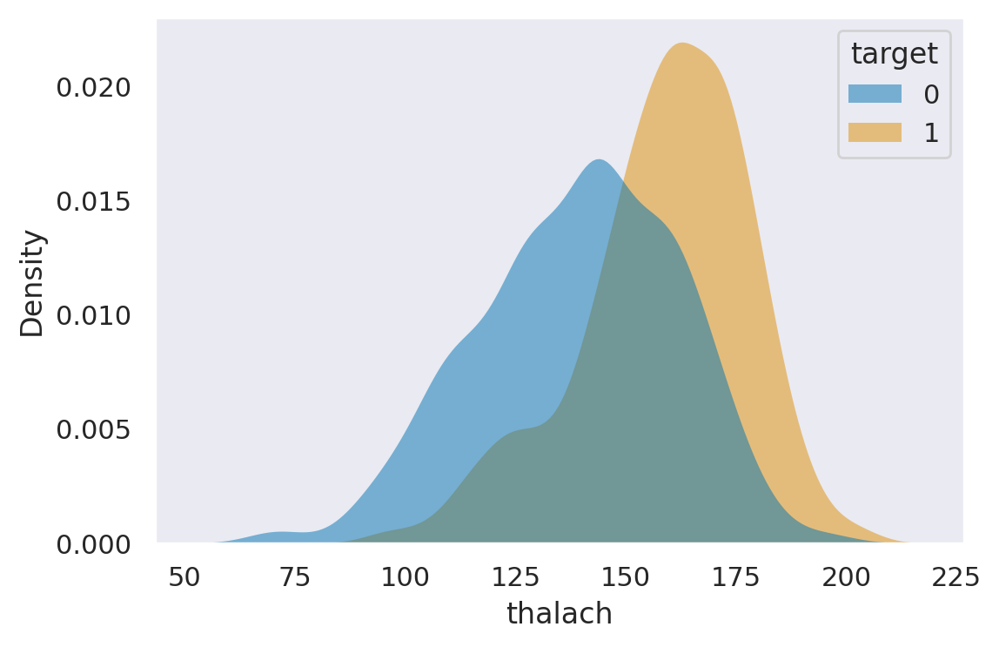

In [ ]:
sns.kdeplot(
   data= df, x="age", hue="target",
   fill=True, common_norm=False, palette="colorblind",
   alpha=.5, linewidth=0,
)
plt.show()

sns.kdeplot(
   data= df, x="oldpeak", hue="target",
   fill=True, common_norm=False, palette="colorblind",
   alpha=.5, linewidth=0,
)
plt.show()

sns.kdeplot(
   data= df, x="thalach", hue="target",
   fill=True, common_norm=False, palette="colorblind",
   alpha=.5, linewidth=0,
)
plt.show()

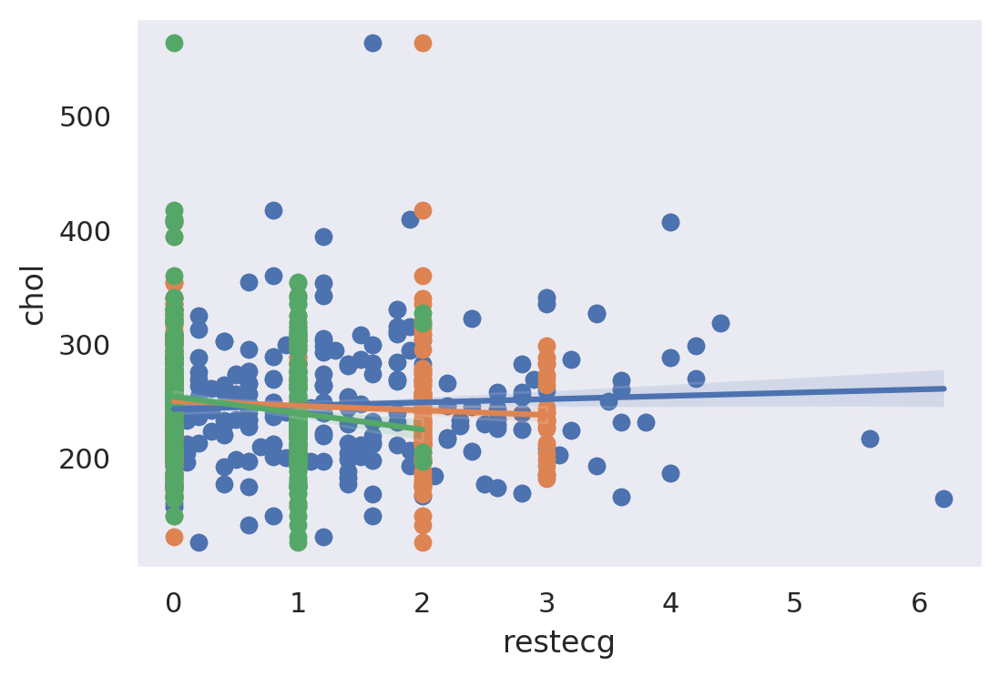

In [ ]:
df = pd.read_csv(url)
sns.regplot(x="oldpeak", y="chol", data=df)
sns.regplot(x="cp", y="chol", data=df)
sns.regplot(x="restecg", y="chol", data=df)

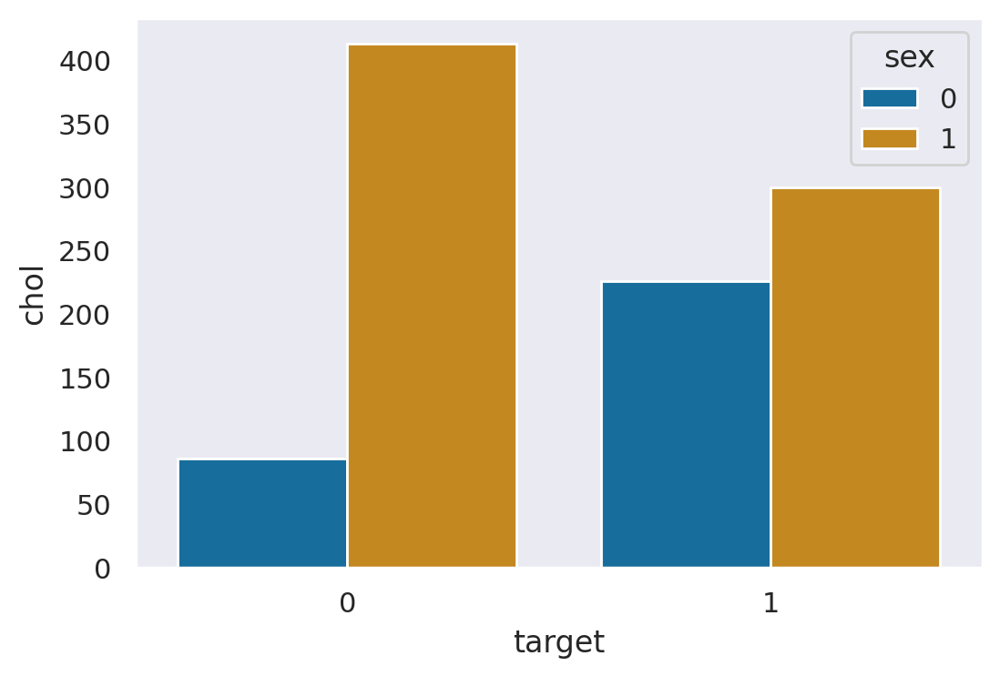

In [ ]:
df = pd.read_csv(url)

# create a barplot to visualize the relationship between the target variable (heart disease) and the sex of the patients
sns.barplot(x="target", y="chol",hue="sex" , data=df, estimator=len, ci=None, palette="colorblind")

age            AxesSubplot(0.125,0.536818;0.0945122x0.343182)
sex         AxesSubplot(0.238415,0.536818;0.0945122x0.343182)
cp          AxesSubplot(0.351829,0.536818;0.0945122x0.343182)
trestbps    AxesSubplot(0.465244,0.536818;0.0945122x0.343182)
chol        AxesSubplot(0.578659,0.536818;0.0945122x0.343182)
fbs         AxesSubplot(0.692073,0.536818;0.0945122x0.343182)
restecg     AxesSubplot(0.805488,0.536818;0.0945122x0.343182)
thalach           AxesSubplot(0.125,0.125;0.0945122x0.343182)
exang          AxesSubplot(0.238415,0.125;0.0945122x0.343182)
oldpeak        AxesSubplot(0.351829,0.125;0.0945122x0.343182)
slope          AxesSubplot(0.465244,0.125;0.0945122x0.343182)
ca             AxesSubplot(0.578659,0.125;0.0945122x0.343182)
thal           AxesSubplot(0.692073,0.125;0.0945122x0.343182)
target         AxesSubplot(0.805488,0.125;0.0945122x0.343182)
dtype: object

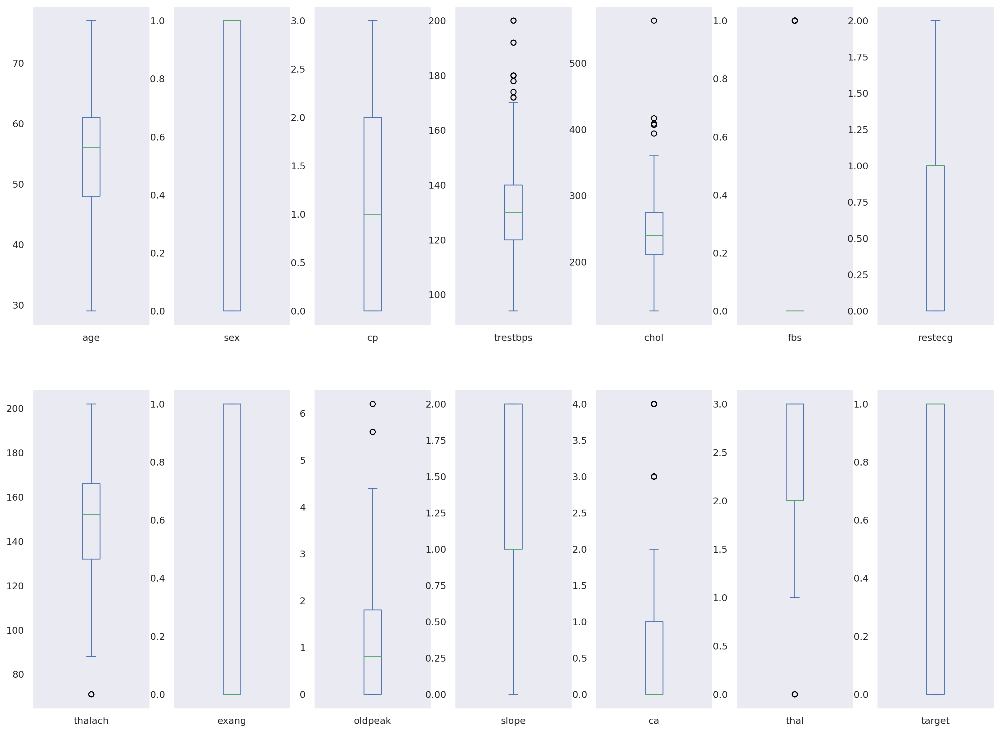

In [ ]:
#checking outliers
df.plot(kind='box',subplots=True,sharex=False,sharey=False,layout=(2,7),figsize=(20,15))

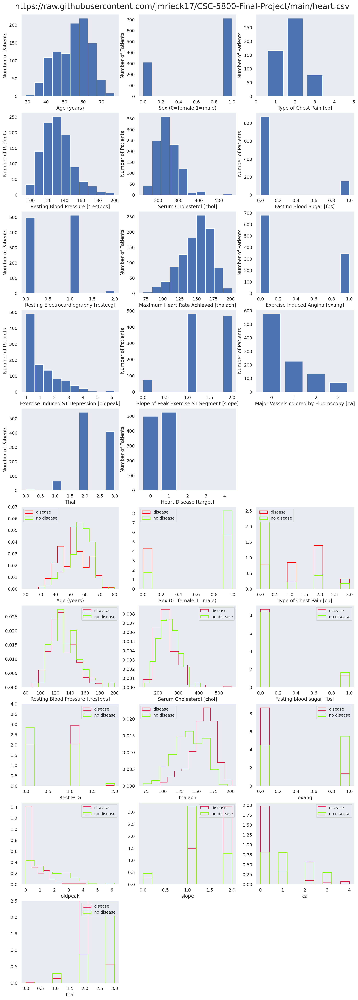

In [ ]:
fig, axes = plt.subplots( nrows=10, ncols=3, figsize=(15,40) )
plt.subplots_adjust( wspace=0.20, hspace=0.20, top=0.97 )
plt.suptitle(url, fontsize=20)
axes[0,0].hist(df.age)
axes[0,0].set_xlabel("Age (years)")
axes[0,0].set_ylabel("Number of Patients")
axes[0,1].hist(df.sex)
axes[0,1].set_xlabel("Sex (0=female,1=male)")
axes[0,1].set_ylabel("Number of Patients")
axes[0,2].hist(df.cp,bins=4,range=(0.5,4.5),rwidth=0.80)
axes[0,2].set_xlim(0.0,5.0)
axes[0,2].set_xlabel("Type of Chest Pain [cp]")
axes[0,2].set_ylabel("Number of Patients")
axes[1,0].hist(df.trestbps)
axes[1,0].set_xlabel("Resting Blood Pressure [trestbps]")
axes[1,0].set_ylabel("Number of Patients")
axes[1,1].hist(df.chol)
axes[1,1].set_xlabel("Serum Cholesterol [chol]")
axes[1,1].set_ylabel("Number of Patients")
axes[1,2].hist(df.fbs)
axes[1,2].set_xlabel("Fasting Blood Sugar [fbs]")
axes[1,2].set_ylabel("Number of Patients")
axes[2,0].hist(df.restecg)
axes[2,0].set_xlabel("Resting Electrocardiography [restecg]")
axes[2,0].set_ylabel("Number of Patients")
axes[2,1].hist(df.thalach)
axes[2,1].set_xlabel("Maximum Heart Rate Achieved [thalach]")
axes[2,1].set_ylabel("Number of Patients")
axes[2,2].hist(df.exang)
axes[2,2].set_xlabel("Exercise Induced Angina [exang]")
axes[2,2].set_ylabel("Number of Patients")
axes[3,0].hist(df.oldpeak)
axes[3,0].set_xlabel("Exercise Induced ST Depression [oldpeak]")
axes[3,0].set_ylabel("Number of Patients")
axes[3,1].hist(df.slope)
axes[3,1].set_xlabel("Slope of Peak Exercise ST Segment [slope]")
axes[3,1].set_ylabel("Number of Patients")
axes[3,2].hist(df.ca,bins=4,range=(-0.5,3.5),rwidth=0.8)
axes[3,2].set_xlim(-0.7,3.7)
axes[3,2].set_xlabel("Major Vessels colored by Fluoroscopy [ca]")
axes[3,2].set_ylabel("Number of Patients")
axes[4,0].hist(df.thal)
axes[4,0].set_xlabel("Thal")
axes[4,0].set_ylabel("Number of Patients")
axes[4,1].hist(df.target,bins=5,range=(-0.5,4.5),rwidth=0.8)
axes[4,1].set_xlabel("Heart Disease [target]")
axes[4,1].set_ylabel("Number of Patients")
axes[4,2].axis("off")
#Marginal Feature Distribution comapared for disease and not-disease
bins = np.linspace(20, 80, 15)
axes[5,0].hist(df[df.target>0].age.tolist(),bins,color=["red"],histtype="step",label="disease",density=True)
axes[5,0].hist(df[df.target==0].age,bins,color=["chartreuse"],histtype="step",label="no disease",density=True)
axes[5,0].set_xlabel("Age (years)")
axes[5,0].set_ylim(0.0,0.070)
axes[5,0].legend(prop={'size': 10},loc="upper left")
axes[5,1].hist(df[df.target>0].sex.tolist(),color=["red"],histtype="step",label="disease",density=True)
axes[5,1].hist(df[df.target==0].sex,color=["chartreuse"],histtype="step",label="no disease",density=True)
axes[5,1].set_xlabel("Sex (0=female,1=male)")
axes[5,1].legend(prop={'size': 10},loc="upper left")
axes[5,2].hist(df[df.target>0].cp.tolist(),color=["red"],histtype="step",label="disease",density=True)
axes[5,2].hist(df[df.target==0].cp,color=["chartreuse"],histtype="step",label="no disease",density=True)
axes[5,2].set_xlabel("Type of Chest Pain [cp]")
axes[5,2].legend(prop={'size': 10},loc="upper left")
bins = np.linspace(80, 200, 15)
axes[6,0].hist(df[df.target>0].trestbps.tolist(),bins,color=["crimson"],histtype="step",label="disease",density=True)
axes[6,0].hist(df[df.target==0].trestbps,bins,color=["chartreuse"],histtype="step",label="no disease",density=True)
axes[6,0].set_xlabel("Resting Blood Pressure [trestbps]")
axes[6,0].legend(prop={'size': 10},loc="upper right")
axes[6,1].hist(df[df.target>0].chol.tolist(),color=["crimson"],histtype="step",label="disease",density=True)
axes[6,1].hist(df[df.target==0].chol,color=["chartreuse"],histtype="step",label="no disease",density=True)
axes[6,1].set_xlabel("Serum Cholesterol [chol]")
axes[6,1].legend(prop={'size': 10},loc="upper right")
axes[6,2].hist(df[df.target>0].fbs.tolist(),color=["crimson"],histtype="step",label="disease",density=True)
axes[6,2].hist(df[df.target==0].fbs,color=["chartreuse"],histtype="step",label="no disease",density=True)
axes[6,2].set_xlabel("Fasting blood sugar [fbs]")
axes[6,2].legend(prop={'size': 10},loc="upper right")
axes[7,0].hist(df[df.target>0].restecg.tolist(),color=["crimson"],histtype="step",label="disease",density=True)
axes[7,0].hist(df[df.target==0].restecg,color=["chartreuse"],histtype="step",label="no disease",density=True)
axes[7,0].set_xlabel("Rest ECG")
axes[7,0].set_ylim(0.0,4.0)
axes[7,0].legend(prop={'size': 10},loc="upper right")
axes[7,1].hist(df[df.target>0].thalach.tolist(),color=["crimson"],histtype="step",label="disease",density=True)
axes[7,1].hist(df[df.target==0].thalach,color=["chartreuse"],histtype="step",label="no disease",density=True)
axes[7,1].set_xlabel("thalach")
axes[7,1].legend(prop={'size': 10},loc="upper left")
axes[7,2].hist(df[df.target>0].exang.tolist(),color=["crimson"],histtype="step",label="disease",density=True)
axes[7,2].hist(df[df.target==0].exang,color=["chartreuse"],histtype="step",label="no disease",density=True)
axes[7,2].set_xlabel("exang")
axes[7,2].legend(prop={'size': 10},loc="upper right")
axes[8,0].hist(df[df.target>0].oldpeak.tolist(),color=["crimson"],histtype="step",label="disease",density=True)
axes[8,0].hist(df[df.target==0].oldpeak,color=["chartreuse"],histtype="step",label="no disease",density=True)
axes[8,0].set_xlabel("oldpeak")
axes[8,0].legend(prop={'size': 10},loc="upper right")
axes[8,1].hist(df[df.target>0].slope.tolist(),color=["crimson"],histtype="step",label="disease",density=True)
axes[8,1].hist(df[df.target==0].slope,color=["chartreuse"],histtype="step",label="no disease",density=True)
axes[8,1].set_xlabel("slope")
axes[8,1].legend(prop={'size': 10},loc="upper right")
axes[8,2].hist(df[df.target>0].ca.tolist(),color=["crimson"],histtype="step",label="disease",density=True)
axes[8,2].hist(df[df.target==0].ca,color=["chartreuse"],histtype="step",label="no disease",density=True)
axes[8,2].set_xlabel("ca")
axes[8,2].legend(prop={'size': 10},loc="upper right")
axes[9,0].hist(df[df.target>0].thal.tolist(),color=["crimson"],histtype="step",label="disease",density=True)
axes[9,0].hist(df[df.target==0].thal,color=["chartreuse"],histtype="step",label="no disease",density=True)
axes[9,0].set_xlabel("thal")
axes[9,0].set_ylim(0.0,2.5)
axes[9,0].legend(prop={'size': 10},loc="upper right")

axes[9,1].axis("off")
axes[9,2].axis("off")

plt.show()


In [ ]:
df.columns


Index(['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach',
       'exang', 'oldpeak', 'slope', 'ca', 'thal', 'target'],
      dtype='object')

## Data Pre-Processing Steps

In [ ]:
X = df.iloc[:,:13] # take the 1st 13 columns of the dataframe
y = df.iloc[: , -1] # take the last column of the dataframe

# scaler = MinMaxScaler() # play around with different scalers
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

Split our dataset into testing and training samples to create our prediction algorithms

In [ ]:
X_train,X_test,y_train,y_test = train_test_split(X_scaled,y,test_size=0.2 , 
                                                 random_state = 1234) 
# splitting the dataset into 80% validation and 20% test

##Logistic Regression

To start with, Im going to utilize the python package GridSearchCV to help me fine-tune the hyper-parameters of the logistic regression package. This will tell me which hyper-parameters I need to use to get the highest accuracy score on the machine learning model

In [ ]:
parameters_lr = {
    'penalty' : ['none' , 'l1' , 'l2'],
    'C'       : [100 , 10 , 1.0 , 0.1 , 0.01],
    'solver'  : ['newton-cg' , 'lbfgs' , 'sag' , 'saga'],
    'max_iter' : [100]
}

cv = 5 # so this will split the dataset into 5 kfold validation chunks for the GridSearchCv to run through

lr = LogisticRegression(random_state = 1234)
clf = GridSearchCV(lr,                   
                   param_grid = parameters_lr,  
                   scoring = 'accuracy',        
                   cv = cv)  

clf.fit(X_train , y_train)

print("Tuned Hyperparameters :", clf.best_params_)
print("Accuracy :",clf.best_score_)

/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the

Tuned Hyperparameters : {'C': 100, 'max_iter': 100, 'penalty': 'none', 'solver': 'newton-cg'}
Accuracy : 0.8341463414634147


/usr/local/lib/python3.8/dist-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
75 fits failed out of a total of 300.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
25 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/sklearn/model_selection/_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py", line 1461, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py", line 447, in _check_solver
    raise ValueError(
ValueError: Solver 

Based on the hyper-parameters found above, the best hyper-parameters I can use in my model are:

- penalty = none
- C = 100
- solver = newton-cg

I will now plug those hyper-parameters into the model below for my analysis

In [ ]:
lr = LogisticRegression(C = 100, penalty = 'none' , solver = 'newton-cg' , max_iter = 100, n_jobs = -1 , verbose = 2 , random_state = 1234)
lr.fit(X_train , y_train)
predict_lr = lr.predict(X_test)

print("Accuracy:" , accuracy_score(y_test, predict_lr))
print('Confusion Matrix:')
print(confusion_matrix(y_test, predict_lr))
print('Classification Report Table:')
print(classification_report(y_test, predict_lr))

/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Accuracy: 0.8536585365853658
Confusion Matrix:
[[79 22]
 [ 8 96]]
Classification Report Table:
              precision    recall  f1-score   support

           0       0.91      0.78      0.84       101
           1       0.81      0.92      0.86       104

    accuracy                           0.85       205
   macro avg       0.86      0.85      0.85       205
weighted avg       0.86      0.85      0.85       205



[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    1.1s finished


ROC Curve for Logistic Regression

roc_auc_score for Logistic Regression:  0.9394516374714394


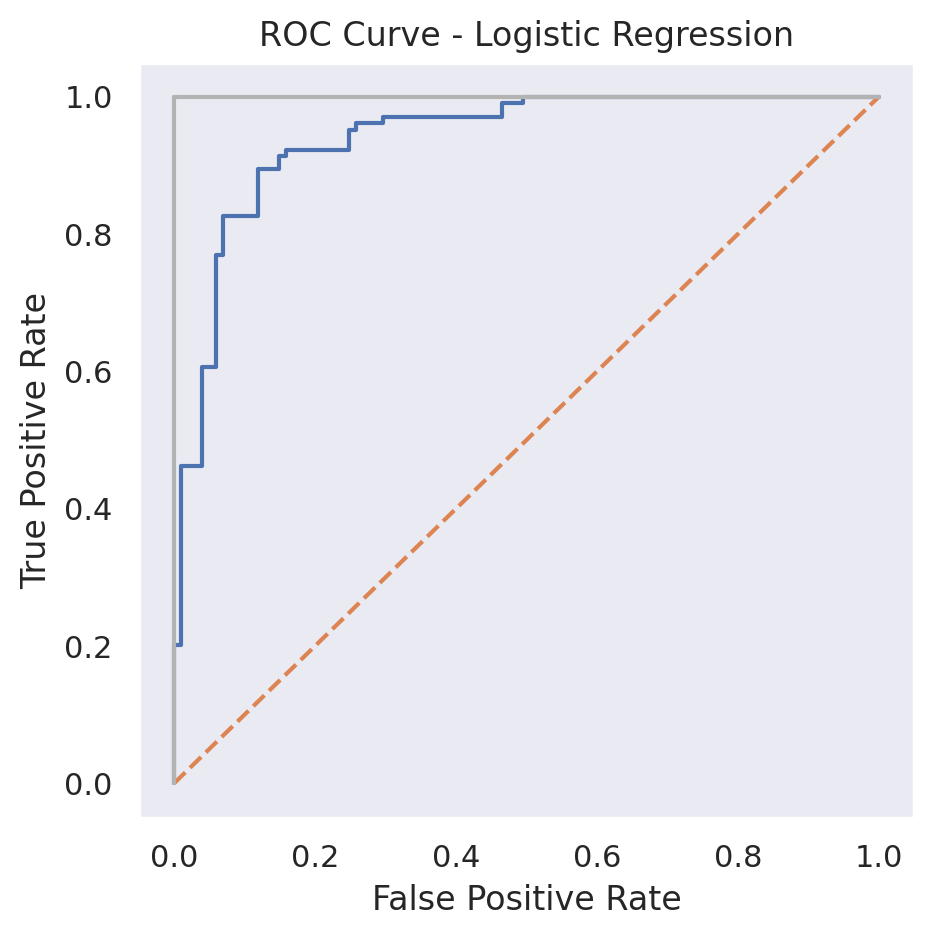

In [ ]:
score_lr = lr.predict_proba(X_test)[:,1]

false_positive_ratelr, true_positive_ratelr, thresholdlr = roc_curve(y_test, score_lr)

print('roc_auc_score for Logistic Regression: ', roc_auc_score(y_test, score_lr))   
  
plt.subplots(1, figsize=(5,5))    
plt.title('ROC Curve - Logistic Regression')
plt.plot(false_positive_ratelr, true_positive_ratelr)
plt.plot([0, 1], ls="--")
plt.plot([0, 0], [1, 0] , c=".7"), plt.plot([1, 1] , c=".7")
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

## Naive Bayes

Since there are fewer hyper-parameters for me to fine tune on the Gaussian Naive Bayes package, i am just going to run the package and pass through my training and test datasets to see what my accuracy score is with this method

In [ ]:
gnb = GaussianNB()
gnb.fit(X_train , y_train)
predict_gnb = gnb.predict(X_test)

print("Accuracy:" , accuracy_score(y_test, predict_gnb))
print('Confusion Matrix:')
print(confusion_matrix(y_test, predict_gnb))
print('Classification Report Table:')
print(classification_report(y_test, predict_gnb))

Accuracy: 0.8390243902439024
Confusion Matrix:
[[79 22]
 [11 93]]
Classification Report Table:
              precision    recall  f1-score   support

           0       0.88      0.78      0.83       101
           1       0.81      0.89      0.85       104

    accuracy                           0.84       205
   macro avg       0.84      0.84      0.84       205
weighted avg       0.84      0.84      0.84       205



roc_auc_score for Naive Bayes:  0.9336443259710586


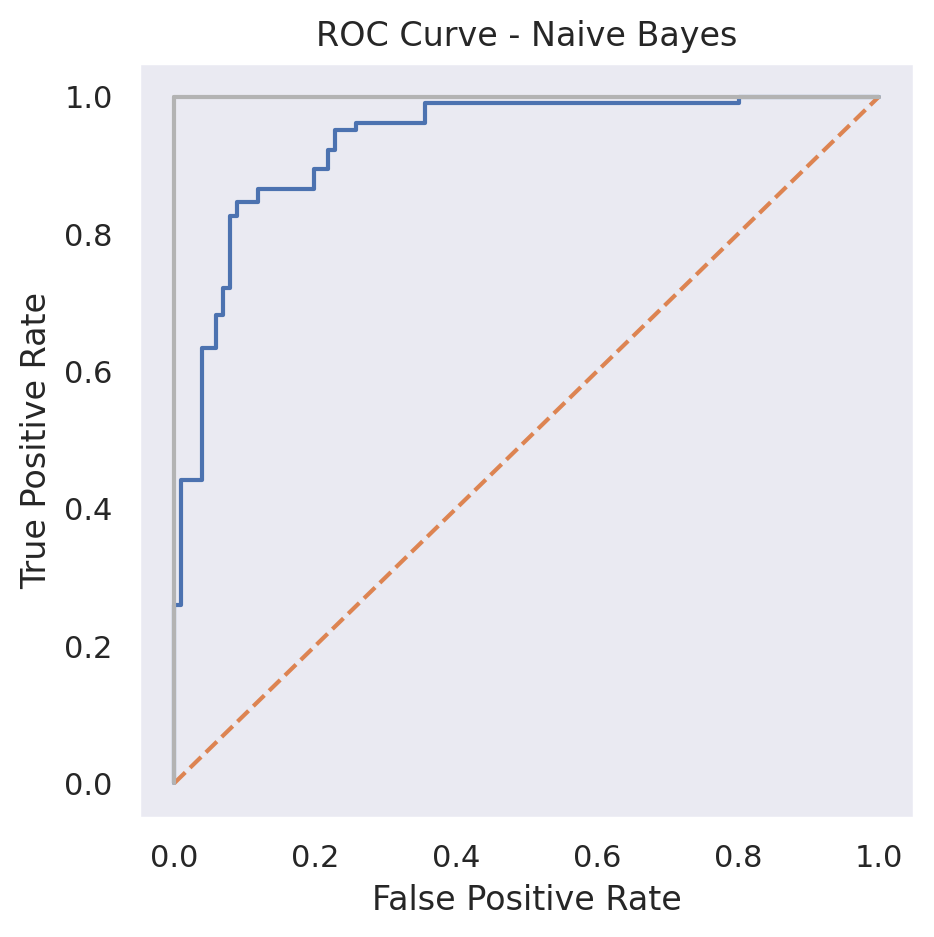

In [ ]:
score_gnb = gnb.predict_proba(X_test)[:,1]

false_positive_rategnb, true_positive_rategnb, thresholdgnb = roc_curve(y_test, score_gnb)

print('roc_auc_score for Naive Bayes: ', roc_auc_score(y_test, score_gnb))   
  
plt.subplots(1, figsize=(5,5))    
plt.title('ROC Curve - Naive Bayes')
plt.plot(false_positive_rategnb, true_positive_rategnb)
plt.plot([0, 1], ls="--")
plt.plot([0, 0], [1, 0] , c=".7"), plt.plot([1, 1] , c=".7")
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

## K Nearest neighbors

In [ ]:
parameters_knn = {
    'n_neighbors' : [1,3,5,7,9,11,13,15,17], # use odd numbers because we want prediction to select the most frequent classifier
    'weights'       : ['uniform' , 'distance'],
    'metric'  : ['euclidean' , 'manhattan' , 'minkowski']
}

cv = 5

knn = KNeighborsClassifier()
knneighbors = GridSearchCV(knn,                   
                   param_grid = parameters_knn,  
                   scoring = 'accuracy',        
                   cv = cv)  

knneighbors.fit(X_train , y_train)

print("Tuned Hyperparameters :", knneighbors.best_params_)
print("Accuracy :",knneighbors.best_score_)

Tuned Hyperparameters : {'metric': 'manhattan', 'n_neighbors': 1, 'weights': 'uniform'}
Accuracy : 0.9926829268292682


Based on the hyper-parameters found above, the best hyper-parameters I can use in my model are:

- n_neighbors = 1
- weights = uniform
- metric = manhattan

I will now plug those hyper-parameters into the model below for my analysis

In [ ]:
knn = KNeighborsClassifier(n_neighbors = 1 , metric = 'manhattan' , weights = 'uniform')
knn.fit(X_train , y_train)
predict_knn = knn.predict(X_test)

print("Accuracy:" , accuracy_score(y_test, predict_knn))
print('Confusion Matrix:')
print(confusion_matrix(y_test, predict_knn))
print('Classification Report Table:')
print(classification_report(y_test, predict_knn))

Accuracy: 1.0
Confusion Matrix:
[[101   0]
 [  0 104]]
Classification Report Table:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       101
           1       1.00      1.00      1.00       104

    accuracy                           1.00       205
   macro avg       1.00      1.00      1.00       205
weighted avg       1.00      1.00      1.00       205



roc_auc_score for K-Nearest Neighbor:  1.0


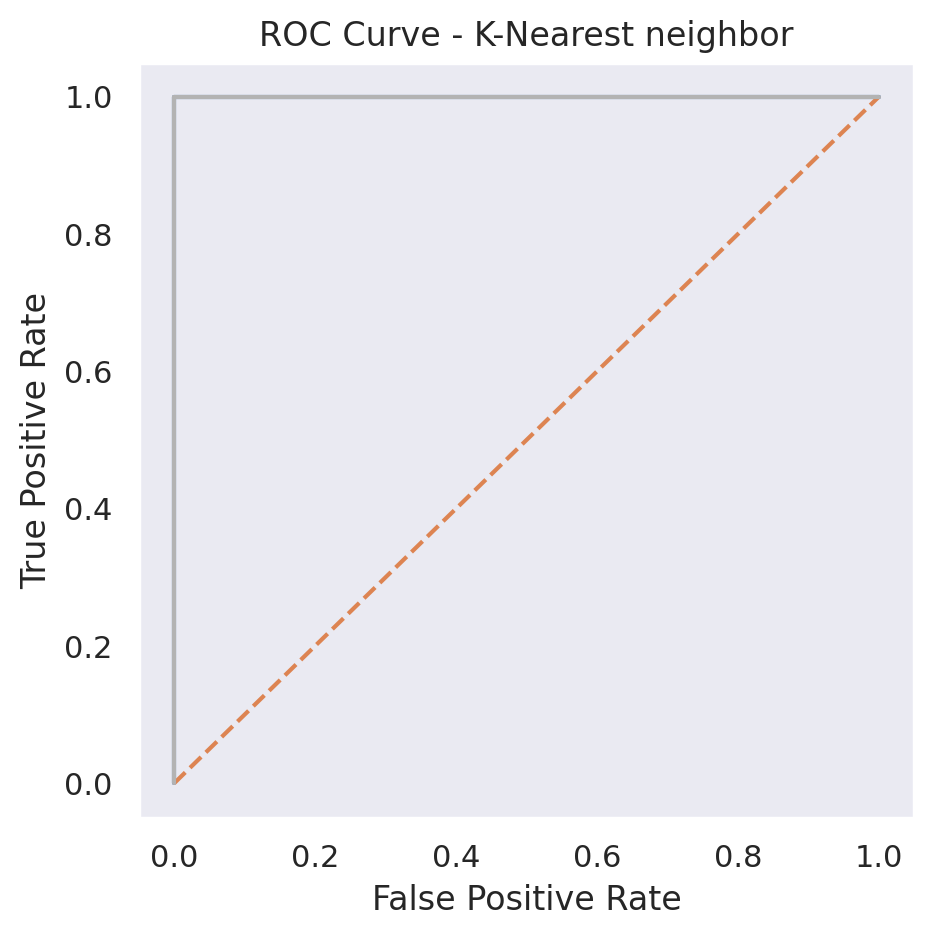

In [ ]:
score_knn = knn.predict_proba(X_test)[:,1]

false_positive_rateknn, true_positive_rateknn, thresholdknn = roc_curve(y_test, score_knn)

print('roc_auc_score for K-Nearest Neighbor: ', roc_auc_score(y_test, score_knn))   
  
plt.subplots(1, figsize=(5,5))    
plt.title('ROC Curve - K-Nearest neighbor')
plt.plot(false_positive_rateknn, true_positive_rateknn)
plt.plot([0, 1], ls="--")
plt.plot([0, 0], [1, 0] , c=".7"), plt.plot([1, 1] , c=".7")
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

## Decision Tree Classifier

In [ ]:
parameters_dtree = {
    'criterion' : [ 'gini', 'entropy', 'log_loss' ],
    'splitter'  : ['best', 'random'],
    'max_leaf_nodes' : [10,15,20]
}

cv = 5 # so this will split the dataset into 5 kfold validation chunks for the GridSearchCv to run through

dtree = DecisionTreeClassifier()
dtc = GridSearchCV(dtree,                   
                   param_grid = parameters_dtree,  
                   scoring = 'accuracy',        
                   cv = cv)  

dtc.fit(X_train , y_train)

print("Tuned Hyperparameters :", dtc.best_params_)
print("Accuracy :",dtc.best_score_)

Tuned Hyperparameters : {'criterion': 'gini', 'max_leaf_nodes': 20, 'splitter': 'best'}
Accuracy : 0.8890243902439025


/usr/local/lib/python3.8/dist-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
30 fits failed out of a total of 90.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
30 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/sklearn/model_selection/_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py", line 937, in fit
    super().fit(
  File "/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py", line 352, in fit
    criterion = CRITERIA_CLF[self.criterion](
KeyError: 'log_loss'

  warnings.warn(some_fits_failed_message, FitFailed

Based on the hyper-parameters found above, the best hyper-parameters I can use in my model are:

- criterion = gini
- splitter = best
- max leaf nodes = 20

I will now plug those hyper-parameters into the model below for my analysis

In [ ]:
dtree = DecisionTreeClassifier(criterion = 'gini' , splitter = 'best' , max_leaf_nodes = 20)
dtree.fit(X_train , y_train)
predict_dtc = dtree.predict(X_test)

print("Accuracy:" , accuracy_score(y_test, predict_dtc))
print('Confusion Matrix:')
print(confusion_matrix(y_test, predict_dtc))
print('Classification Report Table:')
print(classification_report(y_test, predict_dtc))

Accuracy: 0.926829268292683
Confusion Matrix:
[[92  9]
 [ 6 98]]
Classification Report Table:
              precision    recall  f1-score   support

           0       0.94      0.91      0.92       101
           1       0.92      0.94      0.93       104

    accuracy                           0.93       205
   macro avg       0.93      0.93      0.93       205
weighted avg       0.93      0.93      0.93       205



roc_auc_score for Decision Tree:  0.9589204112718964


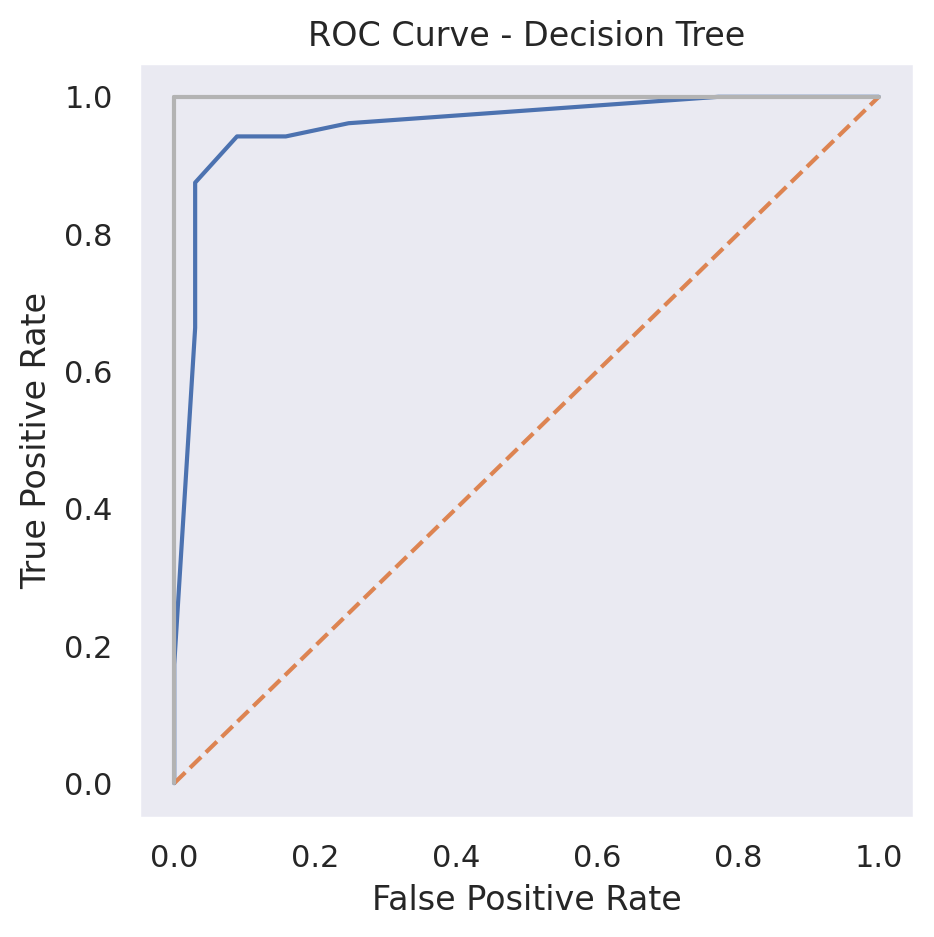

In [ ]:
score_dtree = dtree.predict_proba(X_test)[:,1]

false_positive_ratedtree, true_positive_ratedtree, thresholddtree = roc_curve(y_test, score_dtree)

print('roc_auc_score for Decision Tree: ', roc_auc_score(y_test, score_dtree))   
  
plt.subplots(1, figsize=(5,5))    
plt.title('ROC Curve - Decision Tree')
plt.plot(false_positive_ratedtree, true_positive_ratedtree)
plt.plot([0, 1], ls="--")
plt.plot([0, 0], [1, 0] , c=".7"), plt.plot([1, 1] , c=".7")
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

[Text(0.46875, 0.96875, 'age <= 0.923\ngini = 0.5\nsamples = 820\nvalue = [398, 422]\nclass = 1'),
 Text(0.40625, 0.90625, 'age <= -1.035\ngini = 0.398\nsamples = 566\nvalue = [155, 411]\nclass = 1'),
 Text(0.25, 0.84375, 'sex <= -0.902\ngini = 0.167\nsamples = 250\nvalue = [23, 227]\nclass = 1'),
 Text(0.1875, 0.78125, 'sex <= -0.92\ngini = 0.359\nsamples = 64\nvalue = [15, 49]\nclass = 1'),
 Text(0.125, 0.71875, 'age <= -1.914\ngini = 0.316\nsamples = 61\nvalue = [12, 49]\nclass = 1'),
 Text(0.0625, 0.65625, 'gini = 0.0\nsamples = 24\nvalue = [0, 24]\nclass = 1'),
 Text(0.1875, 0.65625, 'gini = 0.438\nsamples = 37\nvalue = [12, 25]\nclass = 1'),
 Text(0.25, 0.71875, 'gini = 0.0\nsamples = 3\nvalue = [3, 0]\nclass = 0'),
 Text(0.3125, 0.78125, 'gini = 0.082\nsamples = 186\nvalue = [8, 178]\nclass = 1'),
 Text(0.5625, 0.84375, 'sex <= -0.542\ngini = 0.486\nsamples = 316\nvalue = [132, 184]\nclass = 1'),
 Text(0.4375, 0.78125, 'age <= 0.809\ngini = 0.468\nsamples = 91\nvalue = [57, 34]\

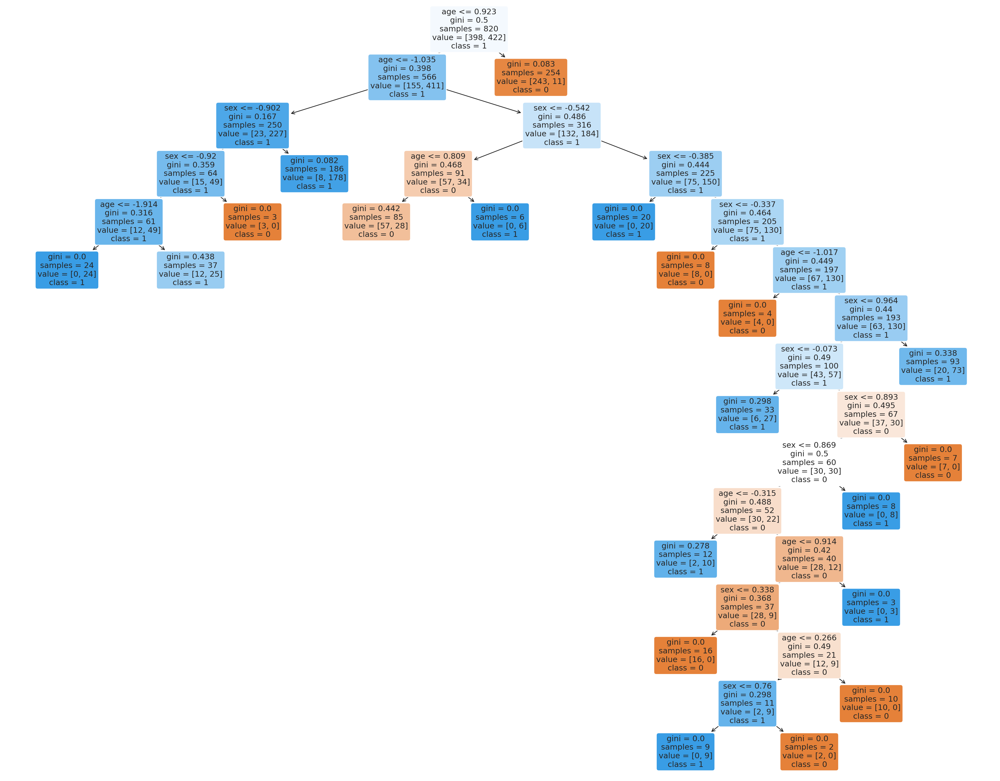

In [ ]:
feature_names = df.columns[:13]

rcParams['figure.figsize'] = (25, 20)
plot_tree(dtree, 
          feature_names = feature_names , 
          class_names = ['0','1'] , 
          filled = True, 
          rounded = True)

In [ ]:
# plt.savefig('tree_visualization.png') 

## Principal Component Analysis (Feature Reduction)

To try and improve the Logistic Regression and Naive Bayes classifier algorithms, we will reduce the number of features in the dataset from 13 to 2 and see if this improves our accuracy scores

In [ ]:
X_scaled_df = pd.DataFrame(X_scaled , columns = ['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach', 'exang', 'oldpeak', 'slope', 'ca', 'thal'])

pca = PCA(n_components = 2)
data_2d = pca.fit_transform(X_scaled_df)
data_2d_df = pd.DataFrame(data_2d , columns = ['x' , 'y'])
data_2d_df['target'] = y
data_2d_df.head()

,x,y,target
0,-0.522577,-1.112868,0
1,2.590414,-0.533060,0
2,3.042517,-1.326965,0
3,-0.492466,-0.276522,0
4,2.187332,1.951025,0


We'll do a quick visualization of the PCA reduction via 2d graph below to see if there are any discernable patterns in the data.

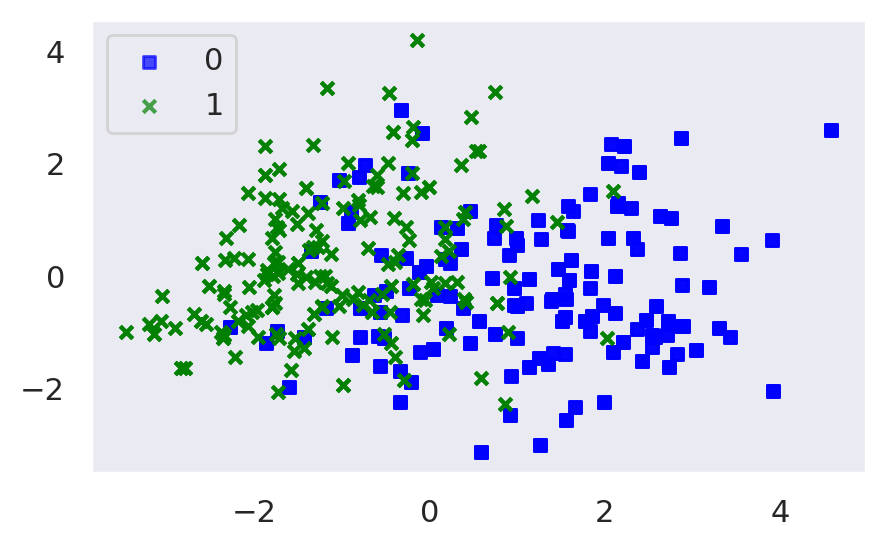

In [ ]:
rcParams['figure.figsize'] = (5, 3)

fig = category_scatter(data = data_2d_df , x = 'x' , y = 'y' , label_col = 'target')

In [ ]:
# plt.savefig('2d_PCA_visualization.png') 

In [ ]:
X_PCA = data_2d_df.iloc[:,:2]
y_PCA = data_2d_df.iloc[: , -1]

X_trainPCA , X_testPCA , y_trainPCA , y_testPCA = train_test_split(X_PCA,y_PCA,test_size=0.2 , random_state = 1234)

In [ ]:
parameters_lr = {
    'penalty' : ['none' , 'l1' , 'l2'],
    'C'       : [100 , 10 , 1.0 , 0.1 , 0.01],
    'solver'  : ['newton-cg' , 'lbfgs' , 'sag' , 'saga'],
    'max_iter' : [100]
}

cv = 5

lr = LogisticRegression(random_state= 1234)
clf = GridSearchCV(lr,                   
                   param_grid = parameters_lr,  
                   scoring = 'accuracy',        
                   cv = cv)  

clf.fit(X_trainPCA , y_trainPCA)

print("Tuned Hyperparameters :", clf.best_params_)
print("Accuracy :",clf.best_score_)

/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the

Tuned Hyperparameters : {'C': 0.01, 'max_iter': 100, 'penalty': 'l2', 'solver': 'newton-cg'}
Accuracy : 0.8012195121951219


/usr/local/lib/python3.8/dist-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
75 fits failed out of a total of 300.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
25 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/sklearn/model_selection/_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py", line 1461, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py", line 447, in _check_solver
    raise ValueError(
ValueError: Solver 

In [ ]:
lr = LogisticRegression(C = 0.01, penalty = 'l2' , solver = 'newton-cg' , max_iter = 100, n_jobs = -1 , verbose = 2 , random_state = 1234)
lr.fit(X_trainPCA , y_trainPCA)
predict_lr = lr.predict(X_testPCA)

print("Accuracy:" , accuracy_score(y_testPCA, predict_lr))
print('Confusion Matrix:')
print(confusion_matrix(y_testPCA, predict_lr))
print('Classification Report Table:')
print(classification_report(y_testPCA, predict_lr))

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Accuracy: 0.8536585365853658
Confusion Matrix:
[[78 23]
 [ 7 97]]
Classification Report Table:
              precision    recall  f1-score   support

           0       0.92      0.77      0.84       101
           1       0.81      0.93      0.87       104

    accuracy                           0.85       205
   macro avg       0.86      0.85      0.85       205
weighted avg       0.86      0.85      0.85       205



[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed:    0.4s finished


roc_auc_score for Logistic Regression:  0.9307882711348058


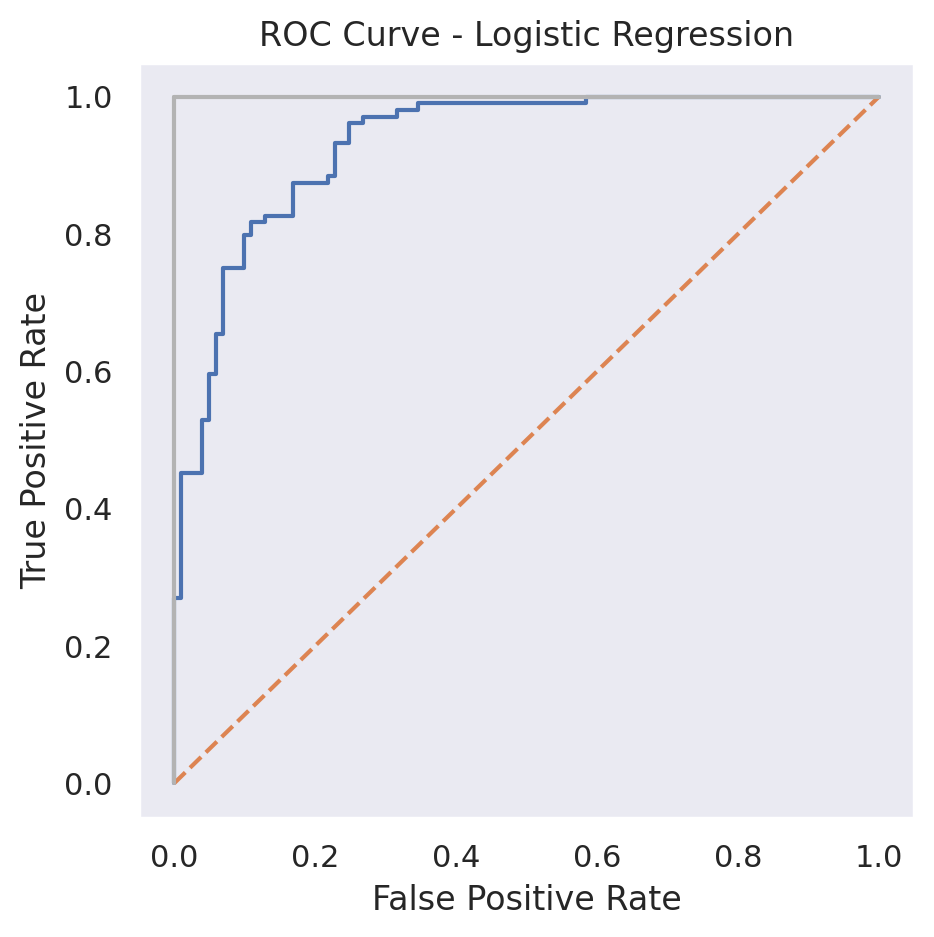

In [ ]:
score_lr = lr.predict_proba(X_testPCA)[:,1]

false_positive_ratelr, true_positive_ratelr, thresholdlr = roc_curve(y_testPCA, score_lr)

print('roc_auc_score for Logistic Regression: ', roc_auc_score(y_testPCA, score_lr))   
  
plt.subplots(1, figsize=(5,5))    
plt.title('ROC Curve - Logistic Regression')
plt.plot(false_positive_ratelr, true_positive_ratelr)
plt.plot([0, 1], ls="--")
plt.plot([0, 0], [1, 0] , c=".7"), plt.plot([1, 1] , c=".7")
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
gnb = GaussianNB()
gnb.fit(X_trainPCA , y_trainPCA)
predict_gnb = gnb.predict(X_testPCA)

print("Accuracy:" , accuracy_score(y_testPCA, predict_gnb))
print('Confusion Matrix:')
print(confusion_matrix(y_testPCA, predict_gnb))
print('Classification Report Table:')
print(classification_report(y_testPCA, predict_gnb))

Accuracy: 0.8585365853658536
Confusion Matrix:
[[78 23]
 [ 6 98]]
Classification Report Table:
              precision    recall  f1-score   support

           0       0.93      0.77      0.84       101
           1       0.81      0.94      0.87       104

    accuracy                           0.86       205
   macro avg       0.87      0.86      0.86       205
weighted avg       0.87      0.86      0.86       205



roc_auc_score for Naive Bayes:  0.9285034272658036


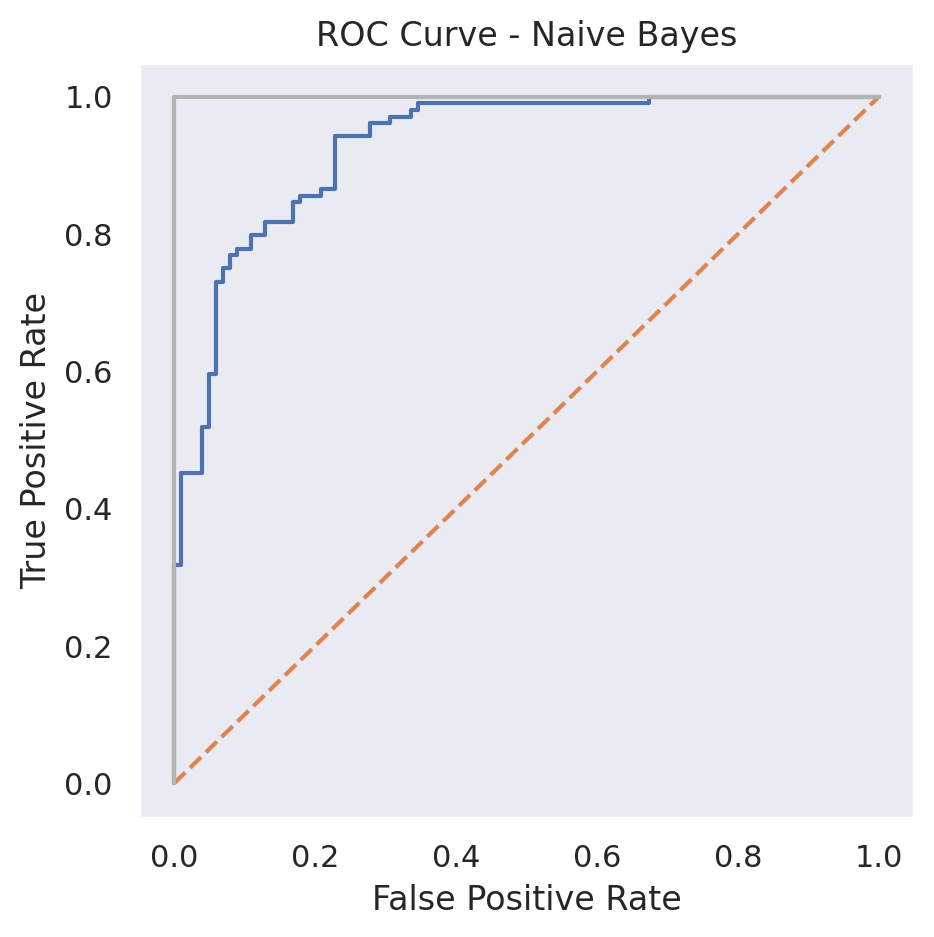

In [ ]:
score_gnb = gnb.predict_proba(X_testPCA)[:,1]

false_positive_rategnb, true_positive_rategnb, thresholdgnb = roc_curve(y_testPCA, score_gnb)

print('roc_auc_score for Naive Bayes: ', roc_auc_score(y_testPCA, score_gnb))   
  
plt.subplots(1, figsize=(5,5))    
plt.title('ROC Curve - Naive Bayes')
plt.plot(false_positive_rategnb, true_positive_rategnb)
plt.plot([0, 1], ls="--")
plt.plot([0, 0], [1, 0] , c=".7"), plt.plot([1, 1] , c=".7")
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

It looks like PCA did offer some slightly better results for the Naive Bayes algorithm and similar results for Logistic Regression

In [ ]:
parameters_knn = {
    'n_neighbors' : [1,3,5,7,9,11,13,15,17],
    'weights'       : ['uniform' , 'distance'],
    'metric'  : ['euclidean' , 'manhattan' , 'minkowski']
}

cv = 5

knn = KNeighborsClassifier()
knneighbors = GridSearchCV(knn,                   
                   param_grid = parameters_knn,  
                   scoring = 'accuracy',        
                   cv = cv)  

knneighbors.fit(X_trainPCA , y_trainPCA)

print("Tuned Hyperparameters :", knneighbors.best_params_)
print("Accuracy :",knneighbors.best_score_)

Tuned Hyperparameters : {'metric': 'euclidean', 'n_neighbors': 17, 'weights': 'distance'}
Accuracy : 0.9902439024390244


In [ ]:
knn = KNeighborsClassifier(n_neighbors = 17 , metric = 'euclidean' , weights = 'distance')
knn.fit(X_trainPCA , y_trainPCA)
predict_knn = knn.predict(X_testPCA)

print("Accuracy:" , accuracy_score(y_testPCA, predict_knn))
print('Confusion Matrix:')
print(confusion_matrix(y_testPCA, predict_knn))
print('Classification Report Table:')
print(classification_report(y_testPCA, predict_knn))

Accuracy: 1.0
Confusion Matrix:
[[101   0]
 [  0 104]]
Classification Report Table:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       101
           1       1.00      1.00      1.00       104

    accuracy                           1.00       205
   macro avg       1.00      1.00      1.00       205
weighted avg       1.00      1.00      1.00       205



roc_auc_score for K-Nearest Neighbor:  1.0


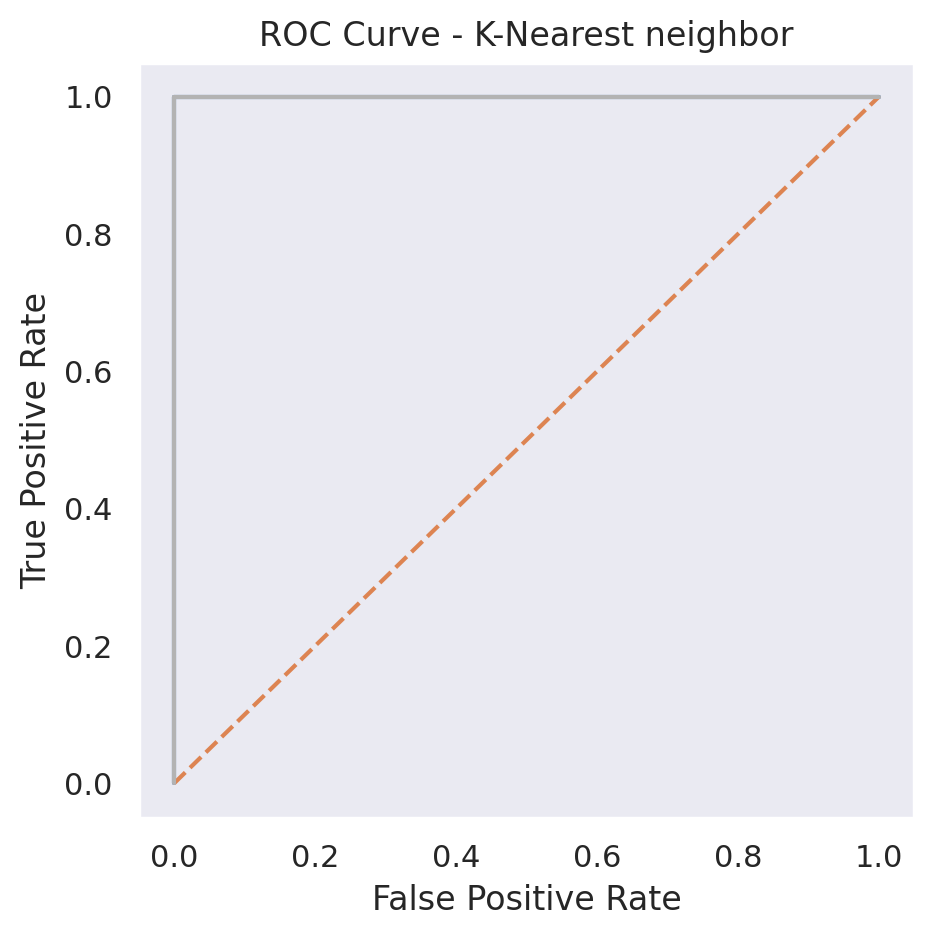

In [ ]:
score_knn = knn.predict_proba(X_testPCA)[:,1]

false_positive_rateknn, true_positive_rateknn, thresholdknn = roc_curve(y_testPCA, score_knn)

print('roc_auc_score for K-Nearest Neighbor: ', roc_auc_score(y_testPCA, score_knn))   
  
plt.subplots(1, figsize=(5,5))    
plt.title('ROC Curve - K-Nearest neighbor')
plt.plot(false_positive_rateknn, true_positive_rateknn)
plt.plot([0, 1], ls="--")
plt.plot([0, 0], [1, 0] , c=".7"), plt.plot([1, 1] , c=".7")
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
parameters_dtree = {
    'criterion' : [ 'gini', 'entropy', 'log_loss' ],
    'splitter'  : ['best', 'random'],
    'max_leaf_nodes' : [10,15,20]
}

cv = 5 # so this will split the dataset into 5 kfold validation chunks for the GridSearchCv to run through

dtree = DecisionTreeClassifier()
dtc = GridSearchCV(dtree,                   
                   param_grid = parameters_dtree,  
                   scoring = 'accuracy',        
                   cv = cv)  

dtc.fit(X_trainPCA , y_trainPCA)

print("Tuned Hyperparameters :", dtc.best_params_)
print("Accuracy :",dtc.best_score_)

Tuned Hyperparameters : {'criterion': 'gini', 'max_leaf_nodes': 20, 'splitter': 'best'}
Accuracy : 0.8463414634146341


/usr/local/lib/python3.8/dist-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
30 fits failed out of a total of 90.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
30 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/sklearn/model_selection/_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py", line 937, in fit
    super().fit(
  File "/usr/local/lib/python3.8/dist-packages/sklearn/tree/_classes.py", line 352, in fit
    criterion = CRITERIA_CLF[self.criterion](
KeyError: 'log_loss'

  warnings.warn(some_fits_failed_message, FitFailed

In [ ]:
dtree = DecisionTreeClassifier(criterion = 'gini' , splitter = 'best' , max_leaf_nodes = 20)
dtree.fit(X_trainPCA , y_trainPCA)
predict_dtc = dtree.predict(X_testPCA)

print("Accuracy:" , accuracy_score(y_testPCA, predict_dtc))
print('Confusion Matrix:')
print(confusion_matrix(y_testPCA, predict_dtc))
print('Classification Report Table:')
print(classification_report(y_testPCA, predict_dtc))

Accuracy: 0.9073170731707317
Confusion Matrix:
[[88 13]
 [ 6 98]]
Classification Report Table:
              precision    recall  f1-score   support

           0       0.94      0.87      0.90       101
           1       0.88      0.94      0.91       104

    accuracy                           0.91       205
   macro avg       0.91      0.91      0.91       205
weighted avg       0.91      0.91      0.91       205



roc_auc_score for Decision Tree:  0.9580635948210205


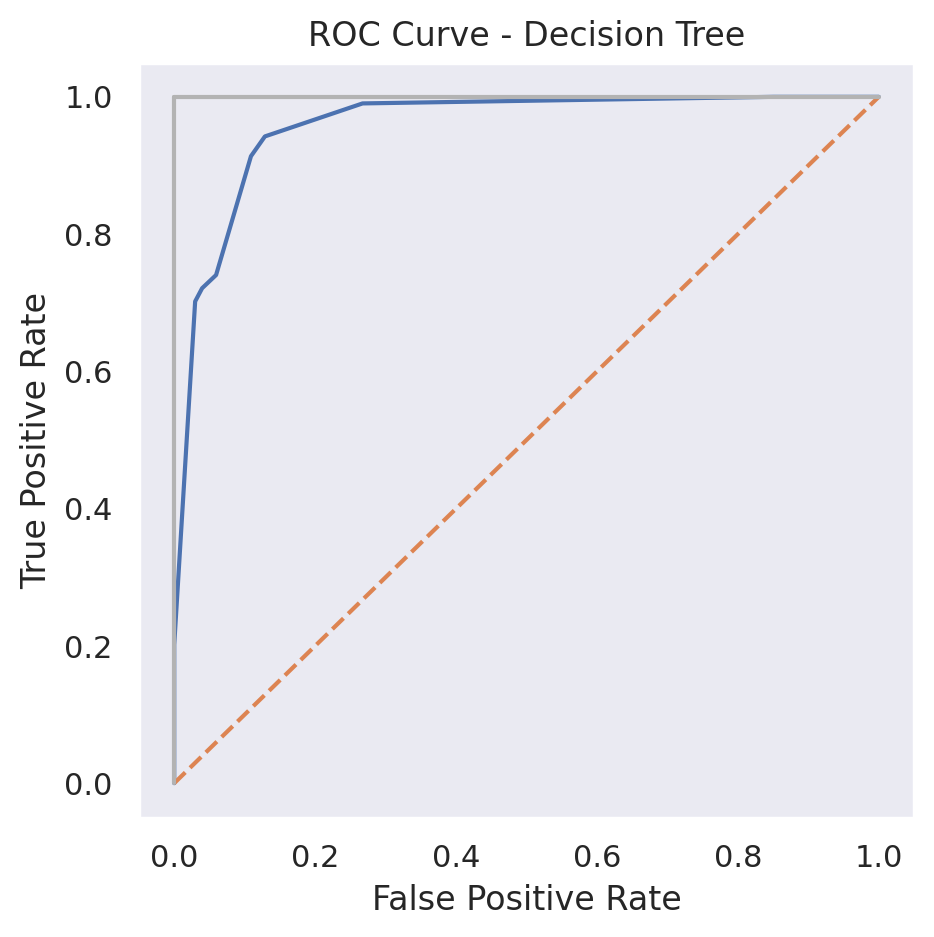

In [ ]:
score_dtree = dtree.predict_proba(X_testPCA)[:,1]

false_positive_ratedtree, true_positive_ratedtree, thresholddtree = roc_curve(y_testPCA, score_dtree)

print('roc_auc_score for Decision Tree: ', roc_auc_score(y_testPCA, score_dtree))   
  
plt.subplots(1, figsize=(5,5))    
plt.title('ROC Curve - Decision Tree')
plt.plot(false_positive_ratedtree, true_positive_ratedtree)
plt.plot([0, 1], ls="--")
plt.plot([0, 0], [1, 0] , c=".7"), plt.plot([1, 1] , c=".7")
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

[Text(0.46875, 0.96875, 'x <= 0.923\ngini = 0.5\nsamples = 820\nvalue = [398, 422]\nclass = 1'),
 Text(0.40625, 0.90625, 'x <= -1.035\ngini = 0.398\nsamples = 566\nvalue = [155, 411]\nclass = 1'),
 Text(0.25, 0.84375, 'y <= -0.902\ngini = 0.167\nsamples = 250\nvalue = [23, 227]\nclass = 1'),
 Text(0.1875, 0.78125, 'y <= -0.92\ngini = 0.359\nsamples = 64\nvalue = [15, 49]\nclass = 1'),
 Text(0.125, 0.71875, 'x <= -1.914\ngini = 0.316\nsamples = 61\nvalue = [12, 49]\nclass = 1'),
 Text(0.0625, 0.65625, 'gini = 0.0\nsamples = 24\nvalue = [0, 24]\nclass = 1'),
 Text(0.1875, 0.65625, 'gini = 0.438\nsamples = 37\nvalue = [12, 25]\nclass = 1'),
 Text(0.25, 0.71875, 'gini = 0.0\nsamples = 3\nvalue = [3, 0]\nclass = 0'),
 Text(0.3125, 0.78125, 'gini = 0.082\nsamples = 186\nvalue = [8, 178]\nclass = 1'),
 Text(0.5625, 0.84375, 'y <= -0.542\ngini = 0.486\nsamples = 316\nvalue = [132, 184]\nclass = 1'),
 Text(0.4375, 0.78125, 'x <= 0.809\ngini = 0.468\nsamples = 91\nvalue = [57, 34]\nclass = 0'),


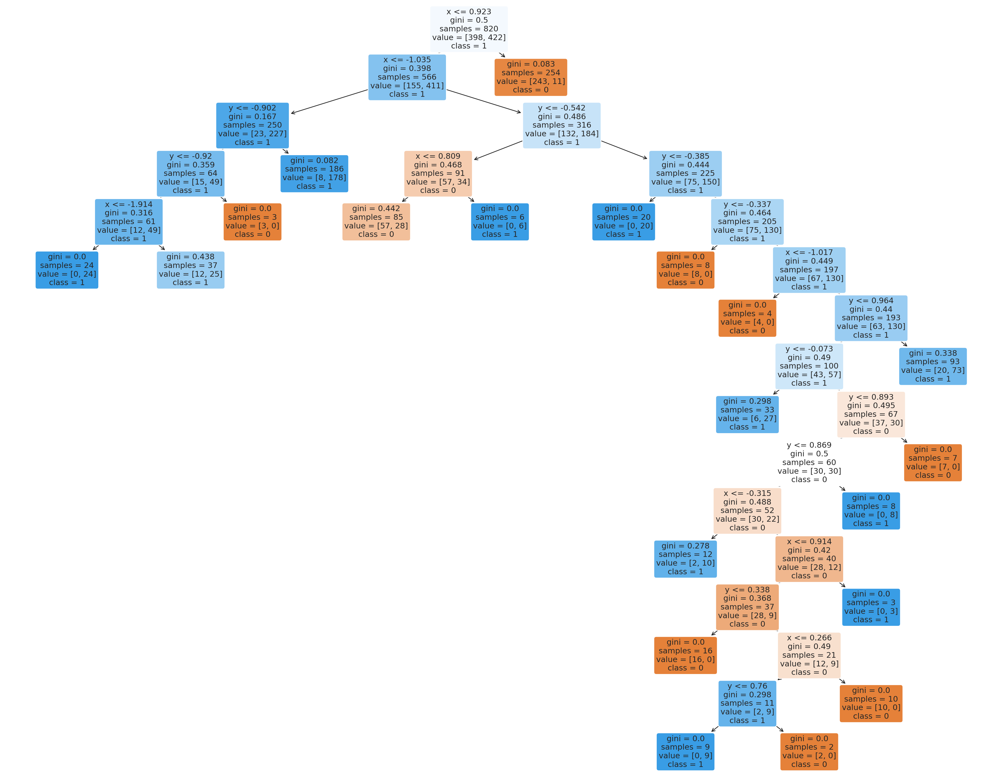

In [ ]:
feature_names = data_2d_df.columns[:2]

rcParams['figure.figsize'] = (25, 20)
plot_tree(dtree, 
          feature_names = feature_names , 
          class_names = ['0','1'] , 
          filled = True, 
          rounded = True)

If we were to convert all of our X variables to an integer, I believe that the decision tree would be a lot less complex; the only tradeoff of that is that our accuracy scores may not be 100%.